<a href="https://colab.research.google.com/github/Bhavy0906/CycleGAN/blob/main/Group_5_Unpaired_Image_to_Image_Translation_using_Cycle_Consistent_Adversarial_Networks_(VanGogh_style_transfer).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks

**Objective**

1) Train a cycleGAN model using vangogh2photo dataset for Van Gogh style transfer

2) Plot the training losses for each epoch

3) Test the model on real photographs and dataset of another painting style

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow-addons==0.8.3
!pip install tensorflow==2.2.0-rc3

     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 516.2 MB 11 kB/s 
     |████████████████████████████████| 454 kB 32.4 MB/s 
     |████████████████████████████████| 2.9 MB 32.9 MB/s 
     |████████████████████████████████| 3.0 MB 21.2 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
      Successfully uninstalled tensorflow-estimator-2.7.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.7.0
    Uninstalling tensorboard-2.7.0:
      Successfully uninstalled tensorboard-2.7.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
  Attempting uninstall: gast
    Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Successfully uninstalled gast-0.4.0
  Attempting uninstall: tensorflow
    Foun

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as cgndts
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import warnings
cgndts.disable_progress_bar()
autotune = tf.data.experimental.AUTOTUNE
%matplotlib inline


In [ ]:
# Loading the vangogh2photo dataset
dataset, _ = cgndts.load("cycle_gan/vangogh2photo",with_info=True,as_supervised=True)
train_vangogh = dataset["trainA"] 
train_pix = dataset["trainB"]
test_vangogh = dataset["testA"]
test_pix =dataset["testB"]

# 1 batch only as 1 batch will contain all the images in the dataset
batch_size = 1
#buffer size for shuffling
buffer_size = 200

# Size of the random crops to be used during training
input_img_size = (256, 256, 3)

# standard image size
std_img_size = (260, 260)

# Weights initialization
weight_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

# Gamma initializer for instance normalization
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)


# For each pixel value in the image RGB filters, Map values in the range [0,255]  to values [-1, 1]
def normalizing_image(img):
    img = tf.cast(img, dtype=tf.float32)
    return (img / 127.5) - 1.0

# Only resizing and normalization for the test images
def preprocess_test_image(img, label):
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalizing_image(img)
    return img

#preprocessing training images
def preprocess_image(img, label):
    # Random fliping of image to left or right get better training results 
    image = tf.image.random_flip_left_right(img)

    # Resize the original size to a standard size  of 260x260
    image = tf.image.resize(image, [*std_img_size])

    # Randomly crop the image to a image of size 256X256x3
    image = tf.image.random_crop(img, size=[*input_img_size])

    # Normalize the pixel values in the range [-1, 1]
    image = normalizing_image(image)
    return image




Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/vangogh2photo/2.0.0.incompleteKU4PTC/cycle_gan-trainA.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/vangogh2photo/2.0.0.incompleteKU4PTC/cycle_gan-trainB.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/vangogh2photo/2.0.0.incompleteKU4PTC/cycle_gan-testA.tfrecord
Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/vangogh2photo/2.0.0.incompleteKU4PTC/cycle_gan-testB.tfrecord
Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/vangogh2photo/2.0.0. Subsequent calls will reuse this data.


In [ ]:

#preprocessing the training data
train_vangogh = (
    train_vangogh.map(preprocess_image, num_parallel_calls=autotune).cache().shuffle(buffer_size).batch(batch_size)
)
train_pix = (
    train_pix.map(preprocess_image, num_parallel_calls=autotune).cache().shuffle(buffer_size).batch(batch_size)
)
# preprocessing operations to the test data
test_vangogh = (
    test_vangogh.map(preprocess_test_image, num_parallel_calls=autotune).cache().shuffle(buffer_size).batch(batch_size)
)
test_pix = (
    test_pix.map(preprocess_test_image, num_parallel_calls=autotune).cache().shuffle(buffer_size).batch(batch_size)
)


In [ ]:
# Building blocks used in the CycleGAN generators and discriminators

# Reflection padding for the Generator Architecture
class ReflectionPadding(layers.Layer):

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding, self).__init__(**kwargs)

    def call(self, input, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [padding_height, padding_height],
            [padding_width, padding_width],
        ]
        return tf.pad(input, padding_tensor, mode="REFLECT")

# Rk residual block for generator architecture containing 2 3x3 layers with reflection padding
def residual_block(x,activation,kernel_initializer=weight_init,kernel_size=(3, 3),strides=(1, 1),padding="valid",gamma_initializer=gamma_init,use_bias=False):
    input = x
    dim = x.shape[-1]
    
    # layer 1
    x = ReflectionPadding()(input)
    x = layers.Conv2D(dim,kernel_size,strides=strides,kernel_initializer=kernel_initializer,padding=padding,use_bias=use_bias)(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    #layer 2
    x = ReflectionPadding()(x)
    x = layers.Conv2D(dim,kernel_size,strides=strides,kernel_initializer=kernel_initializer,padding=padding,use_bias=use_bias)(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)

    x = layers.add([input, x])
    return x


def downsample(x,filters,activation,kernel_initializer=weight_init,kernel_size=(3, 3),strides=(2, 2),padding="same",gamma_initializer=gamma_init,use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(1/2, 1/2),
    padding="same",
    kernel_initializer=weight_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


## Generator Architecture

In [ ]:

def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")

    #c7s1-64
    x = ReflectionPadding(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=weight_init, use_bias=False)(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)



    # Downsampling Blocks
    
    #d128
    filters *= 2
    x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    #d256
    filters *= 2
    x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # 9 Residual blocks R-256
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))



    # Upsampling Blocks

    #u-128
    filters //= 2
    x = upsample(x, filters, activation=layers.Activation("relu"))
    #u-256
    filters //= 2
    x = upsample(x, filters, activation=layers.Activation("relu"))


    # Final block c7s1-3 followed by tanh activation function
    x = ReflectionPadding(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model


#Discriminator Architecture

In [ ]:

def get_discriminator(
    filters=64, kernel_initializer=weight_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")

    #C64 layer with no instance normalization
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)
    num_filters = filters

    #C128 - C256 - C512 with instance normalization
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )
    #last layer to produce 1-d output, 1 filter
    x = layers.Conv2D(1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer)(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")


## Build the CycleGAN model

We will override the `train_step()` method of the `Model` class
for training via `fit()`.

In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super(CycleGan, self).__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super(CycleGan, self).compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        real_x, real_y = batch_data


        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    we can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adverserial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            
            fake_y = self.gen_G(real_x, training=True)
            
            fake_x = self.gen_F(real_y, training=True)

            # Cycle: x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle : y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )
        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }


## Create a callback that periodically saves generated images

In [ ]:

class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_pix.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.preprocessing.image.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()


## Train the end-to-end model

Epoch 1/19
400/400 [==============================] - ETA: 0s - G_loss: 5.1000 - F_loss: 5.5063 - D_X_loss: 0.1047 - D_Y_loss: 0.1709

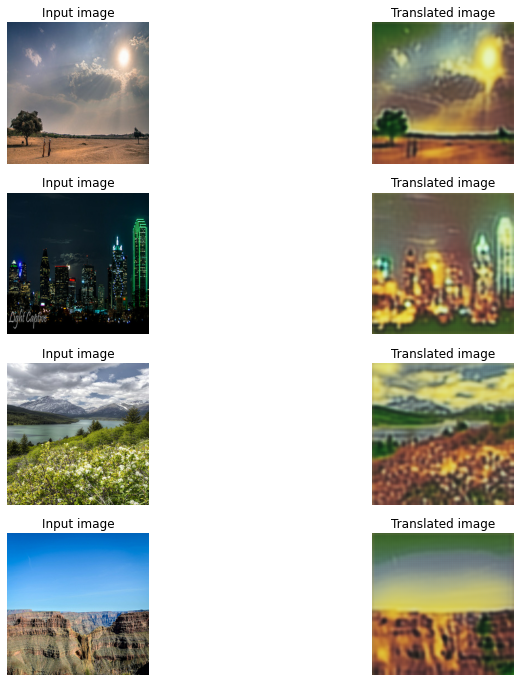

400/400 [==============================] - 641s 2s/step - G_loss: 5.0985 - F_loss: 5.5033 - D_X_loss: 0.1046 - D_Y_loss: 0.1713
Epoch 2/19
400/400 [==============================] - ETA: 0s - G_loss: 4.7582 - F_loss: 4.8054 - D_X_loss: 0.1369 - D_Y_loss: 0.1232

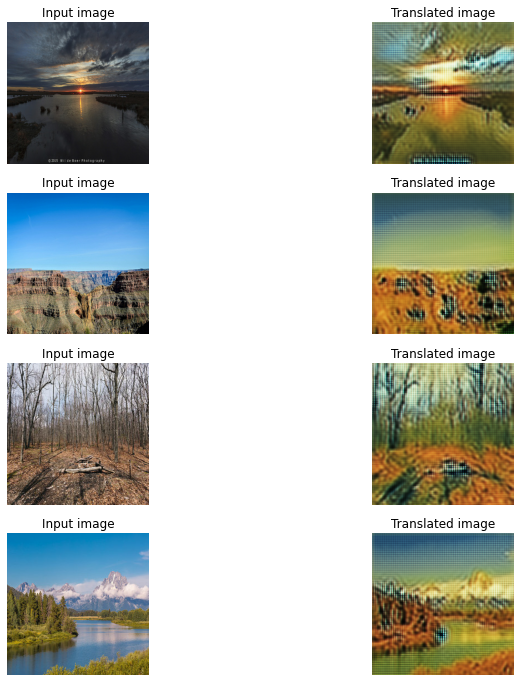

400/400 [==============================] - 641s 2s/step - G_loss: 4.7562 - F_loss: 4.8050 - D_X_loss: 0.1367 - D_Y_loss: 0.1235
Epoch 3/19
400/400 [==============================] - ETA: 0s - G_loss: 4.7106 - F_loss: 4.5403 - D_X_loss: 0.1134 - D_Y_loss: 0.1332

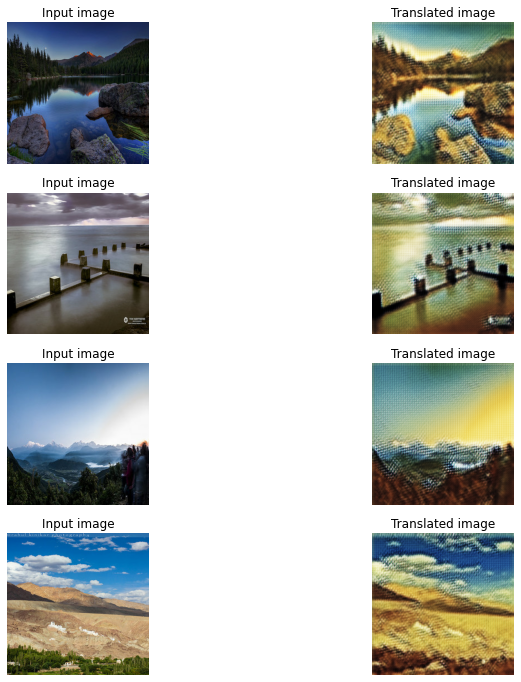

400/400 [==============================] - 641s 2s/step - G_loss: 4.7095 - F_loss: 4.5380 - D_X_loss: 0.1132 - D_Y_loss: 0.1336
Epoch 4/19
400/400 [==============================] - ETA: 0s - G_loss: 4.2917 - F_loss: 4.1218 - D_X_loss: 0.1216 - D_Y_loss: 0.1912

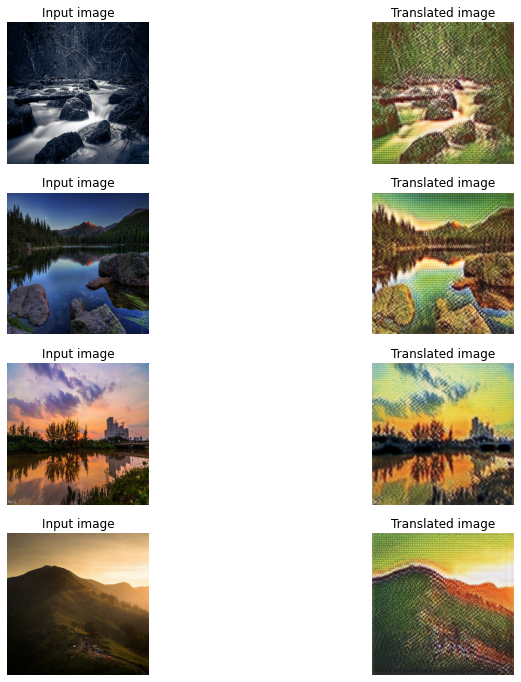

400/400 [==============================] - 640s 2s/step - G_loss: 4.2897 - F_loss: 4.1203 - D_X_loss: 0.1214 - D_Y_loss: 0.1914
Epoch 5/19
400/400 [==============================] - ETA: 0s - G_loss: 4.0463 - F_loss: 4.1118 - D_X_loss: 0.1131 - D_Y_loss: 0.2037

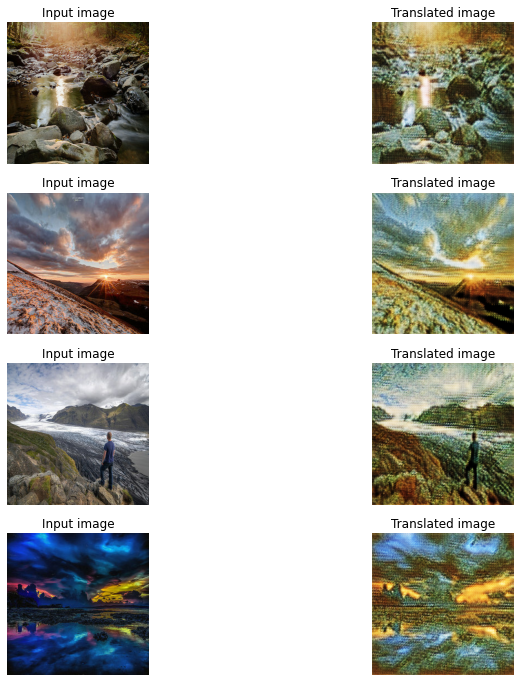

400/400 [==============================] - 640s 2s/step - G_loss: 4.0455 - F_loss: 4.1135 - D_X_loss: 0.1131 - D_Y_loss: 0.2036
Epoch 6/19
400/400 [==============================] - ETA: 0s - G_loss: 3.7677 - F_loss: 3.8437 - D_X_loss: 0.1699 - D_Y_loss: 0.2239

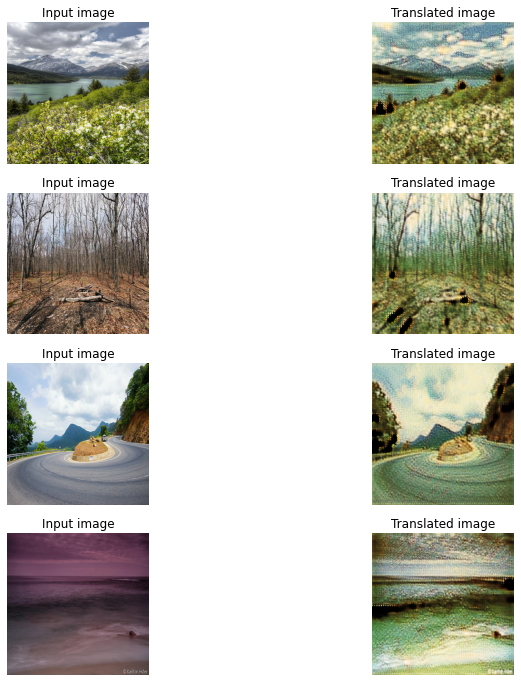

400/400 [==============================] - 640s 2s/step - G_loss: 3.7647 - F_loss: 3.8472 - D_X_loss: 0.1701 - D_Y_loss: 0.2240
Epoch 7/19
400/400 [==============================] - ETA: 0s - G_loss: 3.7018 - F_loss: 3.7129 - D_X_loss: 0.1903 - D_Y_loss: 0.2133

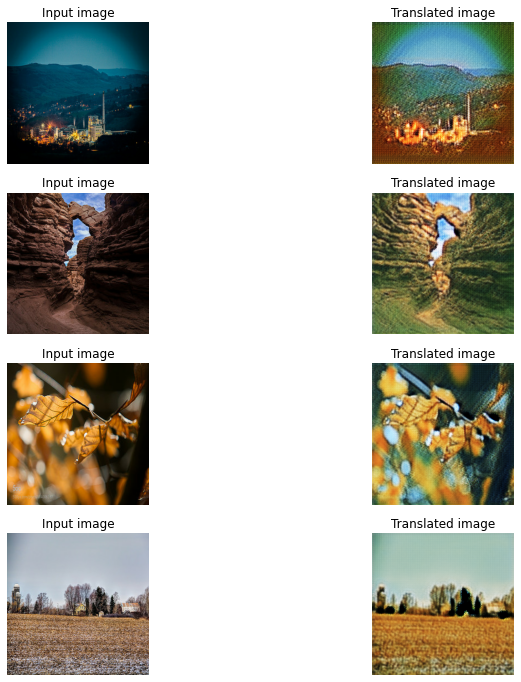

400/400 [==============================] - 640s 2s/step - G_loss: 3.7008 - F_loss: 3.7166 - D_X_loss: 0.1902 - D_Y_loss: 0.2132
Epoch 8/19
400/400 [==============================] - ETA: 0s - G_loss: 3.6285 - F_loss: 3.6606 - D_X_loss: 0.1809 - D_Y_loss: 0.2130

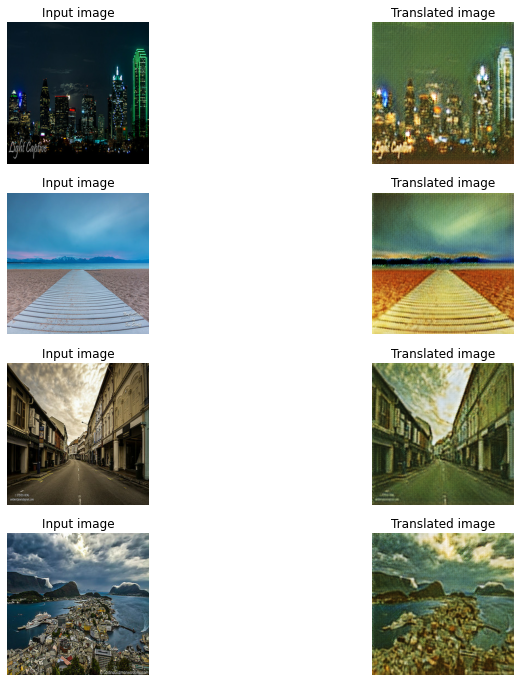

400/400 [==============================] - 641s 2s/step - G_loss: 3.6274 - F_loss: 3.6618 - D_X_loss: 0.1808 - D_Y_loss: 0.2128
Epoch 9/19
400/400 [==============================] - ETA: 0s - G_loss: 3.5757 - F_loss: 3.6063 - D_X_loss: 0.1934 - D_Y_loss: 0.2068

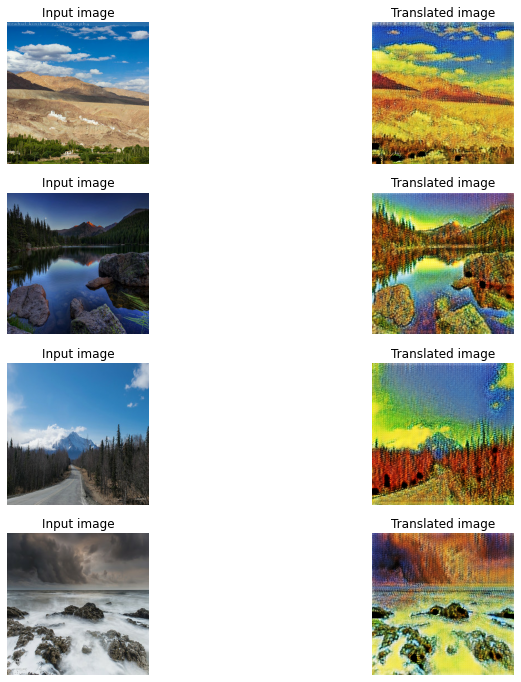

400/400 [==============================] - 640s 2s/step - G_loss: 3.5793 - F_loss: 3.6044 - D_X_loss: 0.1932 - D_Y_loss: 0.2067
Epoch 10/19
400/400 [==============================] - ETA: 0s - G_loss: 3.5034 - F_loss: 3.5449 - D_X_loss: 0.1965 - D_Y_loss: 0.2061

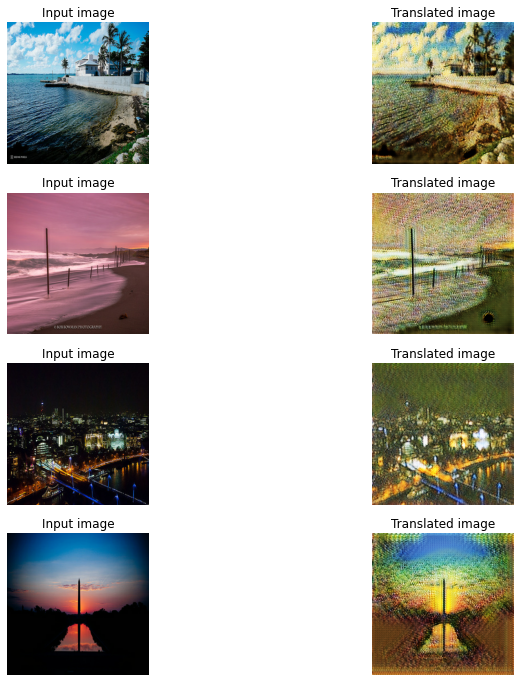

400/400 [==============================] - 642s 2s/step - G_loss: 3.5104 - F_loss: 3.5454 - D_X_loss: 0.1964 - D_Y_loss: 0.2064
Epoch 11/19
400/400 [==============================] - ETA: 0s - G_loss: 3.4625 - F_loss: 3.5379 - D_X_loss: 0.1949 - D_Y_loss: 0.2108

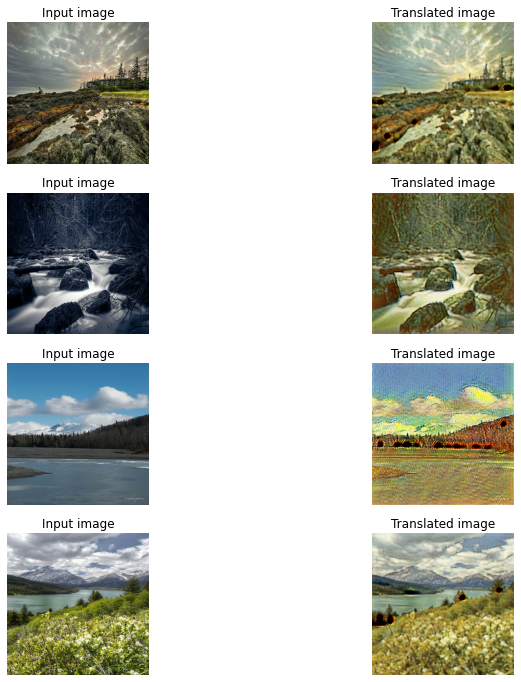

400/400 [==============================] - 645s 2s/step - G_loss: 3.4625 - F_loss: 3.5388 - D_X_loss: 0.1946 - D_Y_loss: 0.2106
Epoch 12/19
400/400 [==============================] - ETA: 0s - G_loss: 3.3870 - F_loss: 3.6140 - D_X_loss: 0.1988 - D_Y_loss: 0.3062

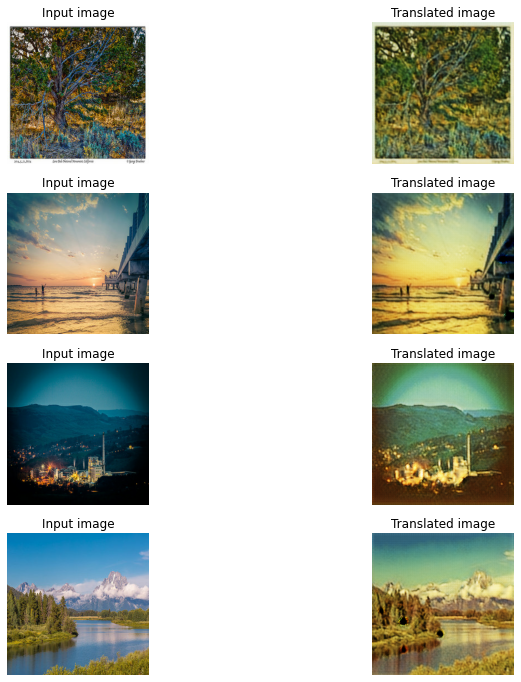

400/400 [==============================] - 646s 2s/step - G_loss: 3.3863 - F_loss: 3.6134 - D_X_loss: 0.1992 - D_Y_loss: 0.3061
Epoch 13/19
400/400 [==============================] - ETA: 0s - G_loss: 3.1834 - F_loss: 3.4075 - D_X_loss: 0.1941 - D_Y_loss: 0.2393

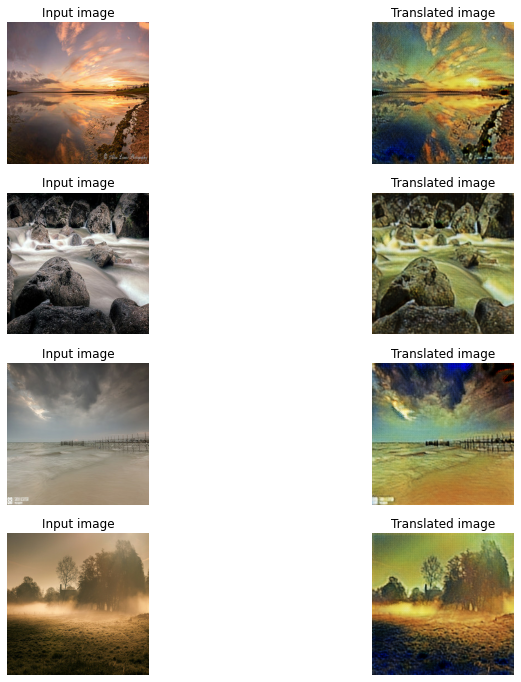

400/400 [==============================] - 643s 2s/step - G_loss: 3.1832 - F_loss: 3.4087 - D_X_loss: 0.1941 - D_Y_loss: 0.2394
Epoch 14/19
400/400 [==============================] - ETA: 0s - G_loss: 3.3110 - F_loss: 3.3366 - D_X_loss: 0.1865 - D_Y_loss: 0.2068

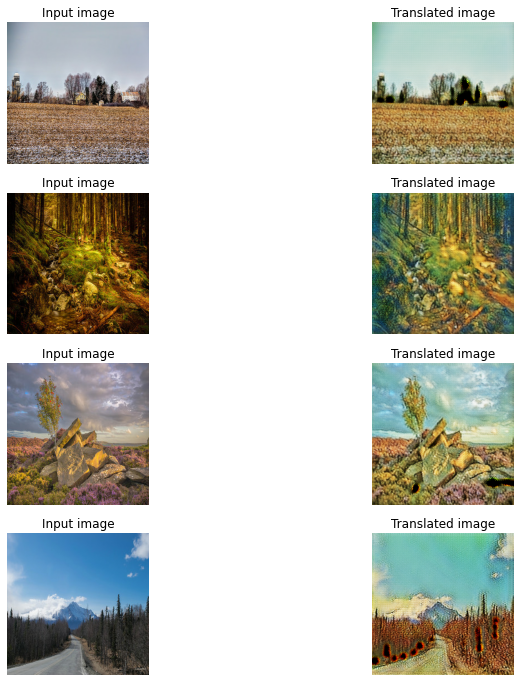

400/400 [==============================] - 638s 2s/step - G_loss: 3.3101 - F_loss: 3.3373 - D_X_loss: 0.1864 - D_Y_loss: 0.2070
Epoch 15/19
400/400 [==============================] - ETA: 0s - G_loss: 3.2876 - F_loss: 3.4308 - D_X_loss: 0.1905 - D_Y_loss: 0.2273

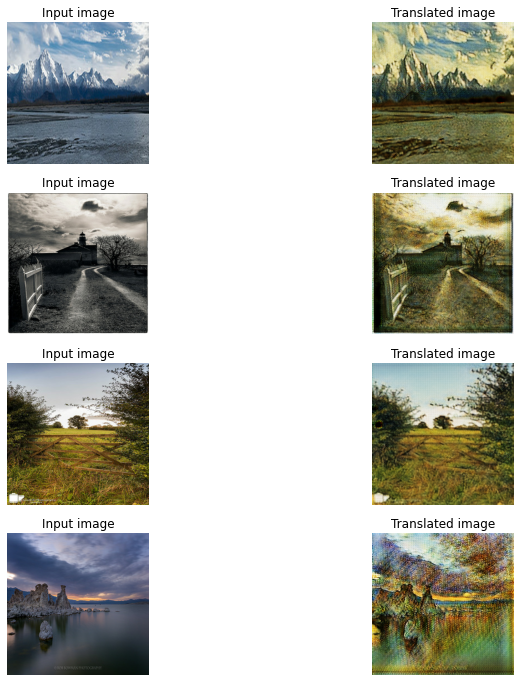

400/400 [==============================] - 637s 2s/step - G_loss: 3.2867 - F_loss: 3.4357 - D_X_loss: 0.1906 - D_Y_loss: 0.2273
Epoch 16/19
400/400 [==============================] - ETA: 0s - G_loss: 3.2207 - F_loss: 3.4397 - D_X_loss: 0.1873 - D_Y_loss: 0.2278

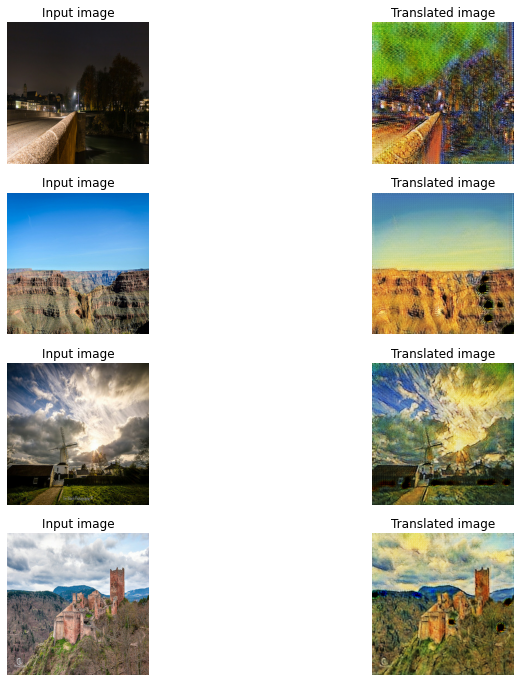

400/400 [==============================] - 638s 2s/step - G_loss: 3.2190 - F_loss: 3.4400 - D_X_loss: 0.1872 - D_Y_loss: 0.2277
Epoch 17/19
400/400 [==============================] - ETA: 0s - G_loss: 3.2103 - F_loss: 3.4053 - D_X_loss: 0.1908 - D_Y_loss: 0.2196

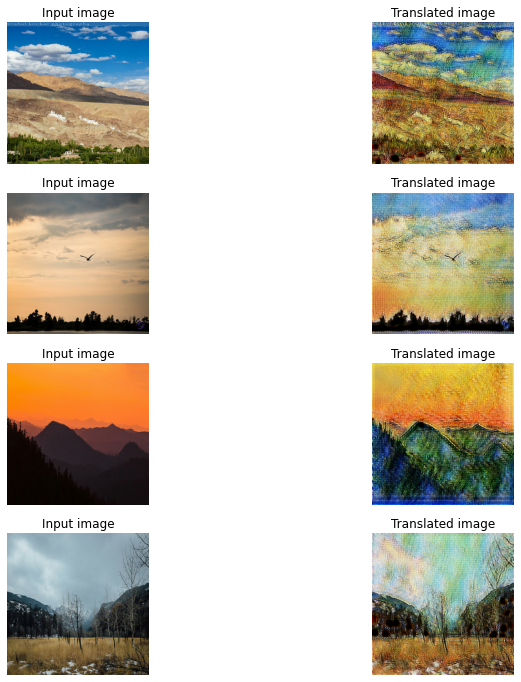

400/400 [==============================] - 638s 2s/step - G_loss: 3.2113 - F_loss: 3.4053 - D_X_loss: 0.1906 - D_Y_loss: 0.2197
Epoch 18/19
400/400 [==============================] - ETA: 0s - G_loss: 3.2002 - F_loss: 3.4208 - D_X_loss: 0.1978 - D_Y_loss: 0.2212

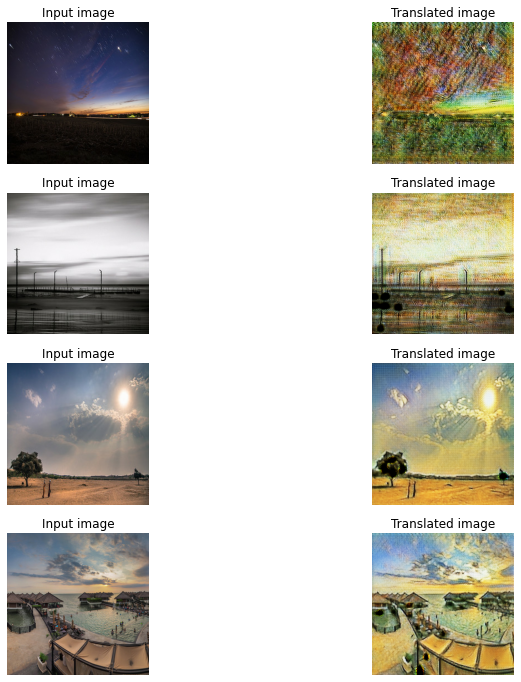

400/400 [==============================] - 637s 2s/step - G_loss: 3.2004 - F_loss: 3.4182 - D_X_loss: 0.1977 - D_Y_loss: 0.2212
Epoch 19/19
400/400 [==============================] - ETA: 0s - G_loss: 3.2695 - F_loss: 3.3997 - D_X_loss: 0.2000 - D_Y_loss: 0.2186

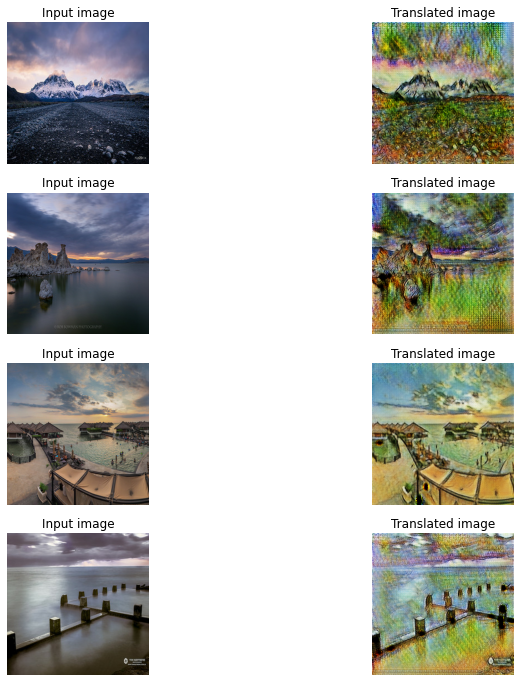

400/400 [==============================] - 637s 2s/step - G_loss: 3.2692 - F_loss: 3.3998 - D_X_loss: 0.2001 - D_Y_loss: 0.2187


In [ ]:

# Loss function for evaluating adversarial loss
adversial_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(image):
    image_loss = adversial_loss_fn(tf.ones_like(image), image)
    return image_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adversial_loss_fn(tf.ones_like(real), real)
    fake_loss = adversial_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks 
plotter = GANMonitor()
checkpoint_filepath = "/content/drive/MyDrive/model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath
)

# training takes 9 minutes for each epoch on colab GPU

training_history=cycle_gan_model.fit(
    tf.data.Dataset.zip((train_pix, train_vangogh)),
    epochs=19,
    callbacks=[plotter, model_checkpoint_callback],
)

{'G_loss': [4.466186046600342, 3.9522738456726074, 4.245646953582764, 3.5032858848571777, 3.732071876525879, 2.57794189453125, 3.2771682739257812, 3.1746747493743896, 4.993124961853027, 6.302009582519531, 3.4457499980926514, 3.093745708465576, 3.1022088527679443, 2.956299304962158, 2.9433236122131348, 2.5117077827453613, 3.600527286529541, 3.2989988327026367, 3.1387877464294434], 'F_loss': [4.28320837020874, 4.680237293243408, 3.6347789764404297, 3.5217370986938477, 4.805267333984375, 5.254248142242432, 5.205297470092773, 4.109771251678467, 2.8510429859161377, 3.7376961708068848, 3.8706448078155518, 3.34205961227417, 3.875946044921875, 3.622828245162964, 5.382023811340332, 3.561248302459717, 3.433488368988037, 2.380990505218506, 3.4603168964385986], 'D_X_loss': [0.07536990940570831, 0.04675903171300888, 0.02249371074140072, 0.04844770208001137, 0.1099415048956871, 0.22704412043094635, 0.15542171895503998, 0.14311695098876953, 0.08540703356266022, 0.13048063218593597, 0.0890505313873291

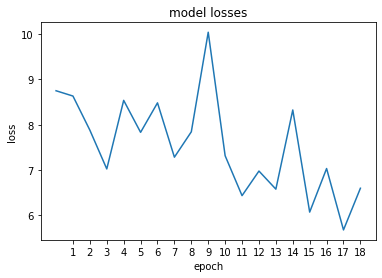

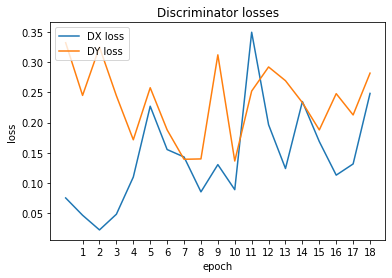

In [ ]:
objective_loss = np.add(training_history.history['F_loss'],training_history.history['G_loss'])
print(training_history.history)

# summarize objective losses per epoch
plt.xticks(range(1,19))
plt.plot(objective_loss)
plt.title('model losses')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# summarize Discriminator losses per epoch
plt.xticks(range(1,19))
plt.plot(training_history.history['D_X_loss'])
plt.plot(training_history.history['D_Y_loss'])
plt.title('Discriminator losses')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['DX loss', 'DY loss'], loc='upper left')
plt.show()



In [ ]:
import pandas as pd

In [ ]:
objective_loss = np.add(training_history.history['F_loss'],training_history.history['G_loss'])
# dictionary of lists  
dict = {'Objective': objective_loss, 'DX loss':training_history.history['D_X_loss'] , 'DY loss':training_history.history['D_Y_loss'] }  
       
df = pd.DataFrame(dict) 
    
# saving the dataframe 
df.to_csv('/content/drive/MyDrive/traininglosses.csv') 

Test the performance of the model.

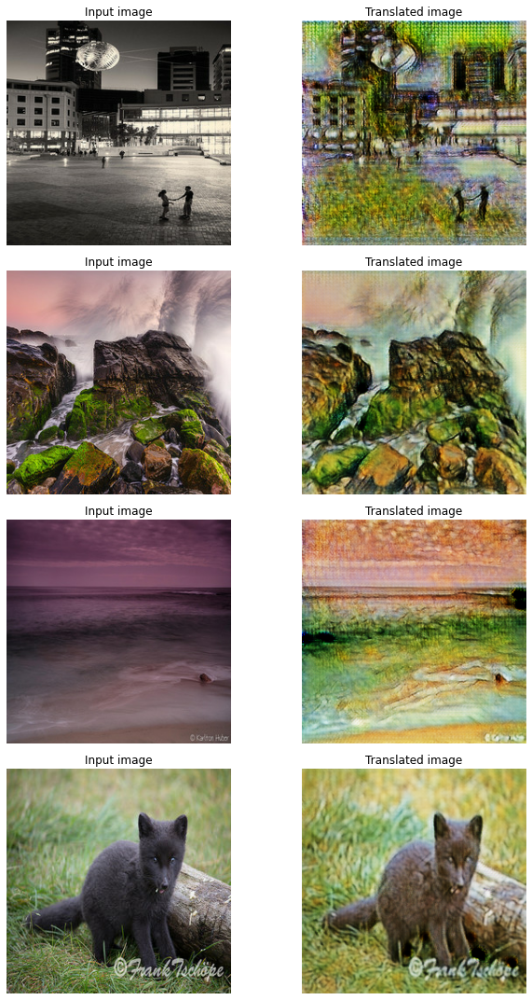

In [ ]:

# Load the checkpoints
# weight_file = "/drive/MyDrive/model_checkpoints/cyclegan_checkpoints.019"
# cycle_gan_model.load_weights(weight_file).expect_partial()
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_pix.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

In [ ]:
datas, _ = cgndts.load("cycle_gan/monet2photo", with_info=True, as_supervised=True)
test_monet_on_vangogh = datas["testA"]

NameError: ignored

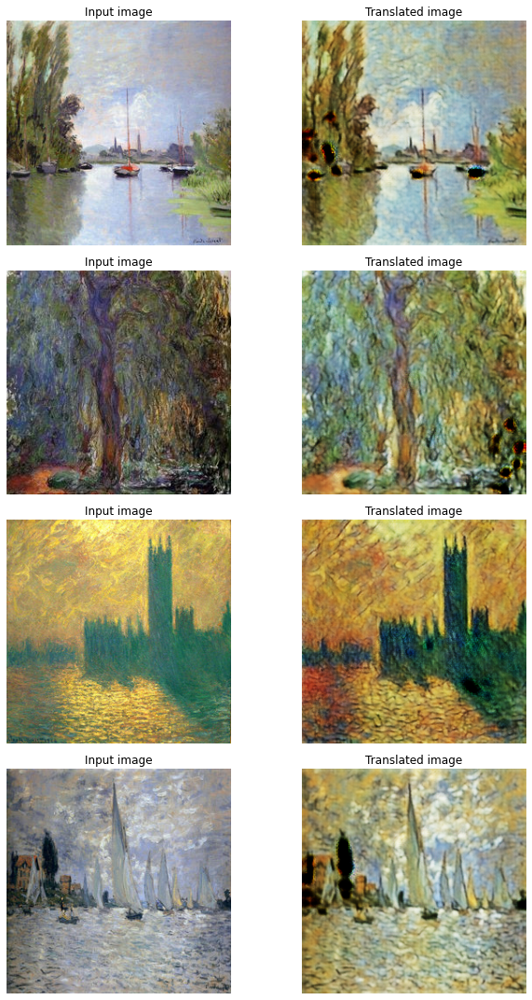

In [ ]:
test_monet_on_vangogh = (
    test_monet_on_vangogh.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_monet_on_vangogh.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()